## 说明：这个文件是ken写在最后的数据预处理的记事本。负责整合之前所有的数据，转成易于读写的pytorch文件

In [9]:
import torch
from torchvision import transforms
from PIL import Image
from matplotlib import pyplot as plt
import numpy as np
import os
from os.path import join
from WordInfo import WordInfo

CVL_path ='/root/autodl-tmp/APS360_Project/Datasets/CVL_Processed'
IAM_path = '/root/autodl-tmp/APS360_Project/Datasets/IAM_Processed'

### 以下是CVL数据集segmentation的部分

In [2]:
# load the images and the bounds
CVL_seg_data_path = join(CVL_path, 'Images')
CVL_seg_label_path = join(CVL_path, 'word_info')
img_list = []
word_info_list = []
# img shape: (1, 1024, 1024)
# word_info shape: (256, 4)

temp = 0
temp_file = ''
for file in os.listdir(CVL_seg_data_path):
    if not file.endswith('.pt'):
        continue
    img_path = join(CVL_seg_data_path, file)
    word_info_path = join(CVL_seg_label_path, file)
    data = torch.load(img_path)
    word_info = torch.load(word_info_path)
    img_list.append(data)

    # 把word_info转成tensor
    label = torch.zeros(256, 4)
    for i, wi in enumerate(word_info):
        if i >= 256:
            break
        label[i] = torch.tensor([wi.x, wi.y, wi.w, wi.h], dtype=torch.float)
    word_info_list.append(label)
    print(file)

img_list = torch.stack(img_list)
word_info_list = torch.stack(word_info_list)

print(img_list.shape)
print(word_info_list.shape)
print(img_list.dtype)
print(word_info_list.dtype)

0014-7.pt
0001-1.pt
0014-8.pt
0001-2.pt
0015-1.pt
0001-3.pt
0015-2.pt
0001-4.pt
0015-4.pt
0001-6.pt
0015-3.pt
0001-7.pt
0015-6.pt
0001-8.pt
0015-7.pt
0002-1.pt
0017-3.pt
0002-2.pt
0017-4.pt
0002-3.pt
0017-6.pt
0002-4.pt
0017-7.pt
0002-6.pt
0017-8.pt
0002-7.pt
0018-1.pt
0002-8.pt
0018-2.pt
0003-1.pt
0018-3.pt
0003-2.pt
0018-4.pt
0003-3.pt
0018-6.pt
0003-4.pt
0018-7.pt
0003-6.pt
0018-8.pt
0003-7.pt
0020-1.pt
0003-8.pt
0020-2.pt
0004-1.pt
0020-3.pt
0004-2.pt
0020-4.pt
0004-3.pt
0020-6.pt
0004-4.pt
0020-7.pt
0004-6.pt
0020-8.pt
0004-7.pt
0021-1.pt
0004-8.pt
0021-2.pt
0005-1.pt
0021-3.pt
0005-2.pt
0021-4.pt
0005-3.pt
0021-6.pt
0005-4.pt
0021-7.pt
0005-6.pt
0021-8.pt
0005-7.pt
0022-1.pt
0005-8.pt
0022-2.pt
0006-1.pt
0022-3.pt
0006-2.pt
0022-4.pt
0006-3.pt
0022-6.pt
0006-4.pt
0022-7.pt
0006-6.pt
0022-8.pt
0006-7.pt
0023-1.pt
0006-8.pt
0023-2.pt
0012-1.pt
0023-3.pt
0012-2.pt
0023-4.pt
0012-3.pt
0023-6.pt
0012-4.pt
0023-7.pt
0012-6.pt
0023-8.pt
0012-7.pt
0024-1.pt
0012-8.pt
0024-2.pt
0013-1.pt


In [4]:
torch.save(img_list, join(CVL_path, 'seg_data.pt'))
torch.save(word_info_list, join(CVL_path, 'seg_label.pt'))

### 以下是IAM数据集segmentation的部分

In [53]:
IAM_seg_data_path = join(IAM_path, 'images')
IAM_seg_label_path = join(IAM_path, 'word_info_lists')
img_list = []
word_info_list = []
# img shape: (1, 1024, 1024)
# word_info shape: (256, 4)

temp = 0
temp_file = ''
for file in os.listdir(IAM_seg_data_path):
    if not file.endswith('.png'):
        continue
    img_path = join(IAM_seg_data_path, file)
    word_info_path = join(IAM_seg_label_path, file[:-4] + '.pt')
    img = Image.open(img_path)
    word_info = torch.load(word_info_path)
    
    # 把图片转成tensor
    trans = transforms.ToTensor()
    data = trans(img)
    img_list.append(data)

    # 把word_info转成tensor
    label = torch.zeros(256, 4)
    for i, wi in enumerate(word_info):
        if i >= 256:
            break
        label[i] = torch.tensor([wi.x, wi.y, wi.w, wi.h], dtype=torch.float)
    word_info_list.append(label)
    print(file)

img_list = torch.stack(img_list)
word_info_list = torch.stack(word_info_list)

print(img_list.shape)
print(word_info_list.shape)
print(img_list.dtype)
print(word_info_list.dtype)


a01-000u.png
a01-053.png
a01-000x.png
a01-053u.png
a01-053x.png
a01-003.png
a01-003u.png
a01-058.png
a01-003x.png
a01-068u.png
a01-007.png
a01-072u.png
a01-007u.png
a01-072x.png
a01-007x.png
a01-077.png
a01-011.png
a01-077u.png
a01-011u.png
a01-082u.png
a01-011x.png
a01-087.png
a01-014.png
a01-087u.png
a01-014u.png
a01-091.png
a01-014x.png
a01-091u.png
a01-020.png
a01-096u.png
a01-020u.png
a01-102.png
a01-020x.png
a01-102u.png
a01-026.png
a01-107.png
a01-026u.png
a01-107u.png
a01-026x.png
a01-113.png
a01-030.png
a01-113u.png
a01-030u.png
a01-117.png
a01-030x.png
a01-117u.png
a01-038.png
a01-122.png
a01-038x.png
a01-122u.png
a01-043.png
a01-128.png
a01-043u.png
a01-128u.png
a01-043x.png
a01-132.png
a01-049.png
a01-132u.png
a01-049u.png
a01-132x.png
a01-049x.png
a02-000.png
a01-058u.png
a02-004.png
a01-058x.png
a02-008.png
a01-063.png
a02-012.png
a01-063u.png
a02-017.png
a01-063x.png
b06-110.png
a02-020.png
a02-024.png
a02-027.png
a02-032.png
a02-037.png
a02-042.png
a02-046.png
a02-050.p

In [37]:
torch.save(img_list, join(IAM_path, 'seg_data.pt'))
torch.save(word_info_list, join(IAM_path, 'seg_label.pt'))

### 以下是CVL数据集recognition的部分

In [11]:
CVL_rec_data_path = join(CVL_path, 'Images/Images_word_pt')

img_list = []
word_info_list = []
# img_list shape: (num_imgs, 1, 128, 128)
# word_info_list shape: (num_imgs, 64, 128) # (num_imgs, max_num_characters, dict_size)

# 使用ascii码作为字典
STX = 2
ETX = 3

for file in os.listdir(CVL_rec_data_path):
    if not file.endswith('.pt'):
        continue
    # print(file)

    # construct word info
    temp = file[:-3].split('-')
    word_word = temp[-1]
    print(word_word)
    word_id = ''
    for i in temp[:-1]:
        word_id += i + '-'
    word_id = word_id[:-1]

    # test if it is in the dictionary
    # if not, skip
    flag = True
    for c in word_word:
        if ord(c) > 127:
            flag = False
            break
    if not flag:
        continue
    if len(word_word) == 0:
        continue

    # make new tensor
    word_info = torch.zeros(64, 128)
    word_info[0, STX] = 1
    for i, c in enumerate(word_word, 1):
        word_info[i, ord(c)] = 1
        print(i, c, ord(c), end=' ')
    print()
    word_info[i+1, ETX] = 1
    word_info_list.append(word_info)

    # read image
    img_path = join(CVL_rec_data_path, file)
    data = torch.load(img_path)
    data = data.float().reshape(1, 128, 128)
    img_list.append(data)

img_list = torch.stack(img_list)
word_info_list = torch.stack(word_info_list)

print(img_list.shape)
print(word_info_list.shape)
print(img_list.dtype)
print(word_info_list.dtype)

or
1 o 111 2 r 114 
Imagine
1 I 73 2 m 109 3 a 97 4 g 103 5 i 105 6 n 110 7 e 101 
country
1 c 99 2 o 111 3 u 117 4 n 110 5 t 116 6 r 114 7 y 121 
a
1 a 97 
and
1 a 97 2 n 110 3 d 100 
vast
1 v 118 2 a 97 3 s 115 4 t 116 
countrymen
1 c 99 2 o 111 3 u 117 4 n 110 5 t 116 6 r 114 7 y 121 8 m 109 9 e 101 10 n 110 
sheet
1 s 115 2 h 104 3 e 101 4 e 101 5 t 116 
Alas
1 A 65 2 l 108 3 a 97 4 s 115 
of
1 o 111 2 f 102 
a
1 a 97 
paper
1 p 112 2 a 97 3 p 112 4 e 101 5 r 114 
few
1 f 102 2 e 101 3 w 119 
on
1 o 111 2 n 110 
years
1 y 121 2 e 101 3 a 97 4 r 114 5 s 115 
which
1 w 119 2 h 104 3 i 105 4 c 99 5 h 104 
sinking
1 s 115 2 i 105 3 n 110 4 k 107 5 i 105 6 n 110 7 g 103 
straight
1 s 115 2 t 116 3 r 114 4 a 97 5 i 105 6 g 103 7 h 104 8 t 116 
ago
1 a 97 2 g 103 3 o 111 
Lines
1 L 76 2 i 105 3 n 110 4 e 101 5 s 115 
below
1 b 98 2 e 101 3 l 108 4 o 111 5 w 119 
Triangles
1 T 84 2 r 114 3 i 105 4 a 97 5 n 110 6 g 103 7 l 108 8 e 101 9 s 115 
it
1 i 105 2 t 116 
Squares
1 S 83 2 q 113 3 u 

In [26]:
torch.save(img_list, join(CVL_path, 'rec_data.pt'))
torch.save(word_info_list, join(CVL_path, 'rec_label.pt'))

### 以下是IAM数据集recognition的部分

In [43]:
IAM_rec_data_path = join(IAM_path, 'cropped_words_rect')
word_txt_path = '/root/autodl-tmp/APS360_Project/Datasets/IAM_Extracted/words.txt'

img_list = []
word_info_list = []
# img_list shape: (num_imgs, 1, 128, 128)
# word_info_list shape: (num_imgs, 64, 128) # (num_imgs, max_num_characters, dict_size)

# 使用ascii码作为字典
STX = 2  # start of text
ETX = 3  # end of text

# 加载单词的信息
# 过滤掉注释行和错误行
with open(word_txt_path, 'r') as file:
    content = file.read()
for line in content.split('\n'):
    if len(line) == 0:
        continue
    if line[0] == '#':
        continue
    line = line.split()
    if line[1] == 'err':
        continue
    if line[3] == '-1':
        continue
    word_id = line[0]
    word_word = ''
    for w in line[8:]:
        word_word += w + ' '
    word_word = word_word[:-1]
    img_path = join(IAM_rec_data_path, line[0] + '.png')

    word_info_list.append((word_id, word_word))


# # 检查是不是所有单词都在ascii码表中
# for word_info in word_info_list:
#     for c in word_info[1]:
#         if c not in dictionary:
#             print(word_info)
#             break
# # 检测通过


# 加载图片
trans = transforms.ToTensor()
for word_info in word_info_list:
    img_path = join(IAM_rec_data_path, word_info[0] + '.png')
    print(word_info)
    data = Image.open(img_path)
    data = trans(data)
    img_list.append(data)

# 把word_info转成tensor
for i, word_info in enumerate(word_info_list):
    label = torch.zeros(64, 128)
    word = word_info[1]
    label[0, STX] = 1
    for j, c in enumerate(word, 1):
        label[j, ord(c)] = 1
    label[j+1, ETX] = 1
    word_info_list[i] = label

img_list = torch.stack(img_list)
word_info_list = torch.stack(word_info_list)

print(img_list.shape)
print(word_info_list.shape)
print(img_list.dtype)
print(word_info_list.dtype)

('a01-000u-00-00', 'A')
('a01-000u-00-01', 'MOVE')
('a01-000u-00-02', 'to')
('a01-000u-00-03', 'stop')
('a01-000u-00-04', 'Mr.')
('a01-000u-00-05', 'Gaitskell')
('a01-000u-00-06', 'from')
('a01-000u-01-00', 'nominating')
('a01-000u-01-01', 'any')
('a01-000u-01-02', 'more')
('a01-000u-01-03', 'Labour')
('a01-000u-01-04', 'life')
('a01-000u-01-05', 'Peers')
('a01-000u-02-00', 'is')
('a01-000u-02-01', 'to')
('a01-000u-02-02', 'be')
('a01-000u-02-03', 'made')
('a01-000u-02-04', 'at')
('a01-000u-02-05', 'a')
('a01-000u-02-06', 'meeting')
('a01-000u-02-07', 'of')
('a01-000u-02-08', 'Labour')
('a01-000u-04-00', 'put')
('a01-000u-04-01', 'down')
('a01-000u-04-02', 'a')
('a01-000u-04-03', 'resolution')
('a01-000u-04-04', 'on')
('a01-000u-04-05', 'the')
('a01-000u-04-06', 'subject')
('a01-000u-06-00', 'Griffiths')
('a01-000u-06-01', ',')
('a01-000u-06-02', 'M P')
('a01-000u-06-03', 'for')
('a01-000u-06-04', 'Manchester')
('a01-000u-06-05', 'Exchange')
('a01-000u-06-06', '.')
('a01-000x-00-00', '

In [44]:
torch.save(img_list, join(IAM_path, 'rec_data.pt'))
torch.save(word_info_list, join(IAM_path, 'rec_label.pt'))

### 最后的最后，分割一下数据集，分成train, val, 和test

In [45]:
# # CVL Segmentation Data Handling
# CVL_seg_data = torch.load(join(CVL_path, 'seg_data.pt'))
# CVL_seg_label = torch.load(join(CVL_path, 'seg_label.pt'))
# CVL_seg_data_train = CVL_seg_data[:int(CVL_seg_data.shape[0]*0.8)].clone()
# CVL_seg_label_train = CVL_seg_label[:int(CVL_seg_label.shape[0]*0.8)].clone()
# CVL_seg_data_val = CVL_seg_data[int(CVL_seg_data.shape[0]*0.8):int(CVL_seg_data.shape[0]*0.9)].clone()
# CVL_seg_label_val = CVL_seg_label[int(CVL_seg_label.shape[0]*0.8):int(CVL_seg_label.shape[0]*0.9)].clone()
# CVL_seg_data_test = CVL_seg_data[int(CVL_seg_data.shape[0]*0.9):].clone()
# CVL_seg_label_test = CVL_seg_label[int(CVL_seg_label.shape[0]*0.9):].clone()
# torch.save(CVL_seg_data_train, join(CVL_path, 'seg_data_train.pt'))
# torch.save(CVL_seg_label_train, join(CVL_path, 'seg_label_train.pt'))
# torch.save(CVL_seg_data_val, join(CVL_path, 'seg_data_val.pt'))
# torch.save(CVL_seg_label_val, join(CVL_path, 'seg_label_val.pt'))
# torch.save(CVL_seg_data_test, join(CVL_path, 'seg_data_test.pt'))
# torch.save(CVL_seg_label_test, join(CVL_path, 'seg_label_test.pt'))
# del CVL_seg_data, CVL_seg_label, CVL_seg_data_train, CVL_seg_label_train, CVL_seg_data_val, CVL_seg_label_val, CVL_seg_data_test, CVL_seg_label_test

# # IAM Segmentation Data Handling
# IAM_seg_data = torch.load(join(IAM_path, 'seg_data.pt'))
# IAM_seg_label = torch.load(join(IAM_path, 'seg_label.pt'))
# IAM_seg_data_train = IAM_seg_data[:int(IAM_seg_data.shape[0]*0.8)].clone()
# IAM_seg_label_train = IAM_seg_label[:int(IAM_seg_label.shape[0]*0.8)].clone()
# IAM_seg_data_val = IAM_seg_data[int(IAM_seg_data.shape[0]*0.8):int(IAM_seg_data.shape[0]*0.9)].clone()
# IAM_seg_label_val = IAM_seg_label[int(IAM_seg_label.shape[0]*0.8):int(IAM_seg_label.shape[0]*0.9)].clone()
# IAM_seg_data_test = IAM_seg_data[int(IAM_seg_data.shape[0]*0.9):].clone()
# IAM_seg_label_test = IAM_seg_label[int(IAM_seg_label.shape[0]*0.9):].clone()
# torch.save(IAM_seg_data_train, join(IAM_path, 'seg_data_train.pt'))
# torch.save(IAM_seg_label_train, join(IAM_path, 'seg_label_train.pt'))
# torch.save(IAM_seg_data_val, join(IAM_path, 'seg_data_val.pt'))
# torch.save(IAM_seg_label_val, join(IAM_path, 'seg_label_val.pt'))
# torch.save(IAM_seg_data_test, join(IAM_path, 'seg_data_test.pt'))
# torch.save(IAM_seg_label_test, join(IAM_path, 'seg_label_test.pt'))
# del IAM_seg_data, IAM_seg_label, IAM_seg_data_train, IAM_seg_label_train, IAM_seg_data_val, IAM_seg_label_val, IAM_seg_data_test, IAM_seg_label_test

# # CVL Recognition Data Handling
# CVL_rec_data = torch.load(join(CVL_path, 'rec_data.pt'))
# CVL_rec_label = torch.load(join(CVL_path, 'rec_label.pt'))
# CVL_rec_data_train = CVL_rec_data[:int(CVL_rec_data.shape[0]*0.8)].clone()
# CVL_rec_label_train = CVL_rec_label[:int(CVL_rec_label.shape[0]*0.8)].clone()
# CVL_rec_data_val = CVL_rec_data[int(CVL_rec_data.shape[0]*0.8):int(CVL_rec_data.shape[0]*0.9)].clone()
# CVL_rec_label_val = CVL_rec_label[int(CVL_rec_label.shape[0]*0.8):int(CVL_rec_label.shape[0]*0.9)].clone()
# CVL_rec_data_test = CVL_rec_data[int(CVL_rec_data.shape[0]*0.9):].clone()
# CVL_rec_label_test = CVL_rec_label[int(CVL_rec_label.shape[0]*0.9):].clone()
# torch.save(CVL_rec_data_train, join(CVL_path, 'rec_data_train.pt'))
# torch.save(CVL_rec_label_train, join(CVL_path, 'rec_label_train.pt'))
# torch.save(CVL_rec_data_val, join(CVL_path, 'rec_data_val.pt'))
# torch.save(CVL_rec_label_val, join(CVL_path, 'rec_label_val.pt'))
# torch.save(CVL_rec_data_test, join(CVL_path, 'rec_data_test.pt'))
# torch.save(CVL_rec_label_test, join(CVL_path, 'rec_label_test.pt'))
# del CVL_rec_data, CVL_rec_label, CVL_rec_data_train, CVL_rec_label_train, CVL_rec_data_val, CVL_rec_label_val, CVL_rec_data_test, CVL_rec_label_test

# IAM Recognition Data Handling
IAM_rec_data = torch.load(join(IAM_path, 'rec_data.pt'))
IAM_rec_label = torch.load(join(IAM_path, 'rec_label.pt'))
IAM_rec_data_train = IAM_rec_data[:int(IAM_rec_data.shape[0]*0.8)].clone()
IAM_rec_label_train = IAM_rec_label[:int(IAM_rec_label.shape[0]*0.8)].clone()
IAM_rec_data_val = IAM_rec_data[int(IAM_rec_data.shape[0]*0.8):int(IAM_rec_data.shape[0]*0.9)].clone()
IAM_rec_label_val = IAM_rec_label[int(IAM_rec_label.shape[0]*0.8):int(IAM_rec_label.shape[0]*0.9)].clone()
IAM_rec_data_test = IAM_rec_data[int(IAM_rec_data.shape[0]*0.9):].clone()
IAM_rec_label_test = IAM_rec_label[int(IAM_rec_label.shape[0]*0.9):].clone()
torch.save(IAM_rec_data_train, join(IAM_path, 'rec_data_train.pt'))
torch.save(IAM_rec_label_train, join(IAM_path, 'rec_label_train.pt'))
torch.save(IAM_rec_data_val, join(IAM_path, 'rec_data_val.pt'))
torch.save(IAM_rec_label_val, join(IAM_path, 'rec_label_val.pt'))
torch.save(IAM_rec_data_test, join(IAM_path, 'rec_data_test.pt'))
torch.save(IAM_rec_label_test, join(IAM_path, 'rec_label_test.pt'))
del IAM_rec_data, IAM_rec_label, IAM_rec_data_train, IAM_rec_label_train, IAM_rec_data_val, IAM_rec_label_val, IAM_rec_data_test, IAM_rec_label_test

### 测试dataset写得好不好

In [25]:
from utils import *

cvl_dataset = SegDataset('CVL', 'train')
iam_dataset = SegDataset('IAM', 'train')

(256, 4)
36	208	16	34	
79	211	69	40	
165	208	33	32	
224	211	52	29	
303	225	58	32	
389	212	44	27	
457	208	65	31	
558	210	82	30	
678	209	214	30	
895	238	6	9	
34	306	42	30	
105	306	163	41	
306	308	65	26	
397	305	130	45	
533	336	3	7	
570	307	49	26	
642	306	97	31	
765	311	29	27	
822	308	93	26	
36	403	113	45	
187	401	27	28	
235	405	51	40	
309	404	44	27	
378	403	91	42	
490	417	13	12	
522	404	61	28	
587	428	5	11	
606	405	91	41	
726	401	58	26	
809	401	23	26	
855	412	59	16	
41	497	71	48	
146	498	142	29	
316	498	69	29	
417	499	182	43	
633	509	102	19	
769	497	26	27	
813	500	93	26	
937	504	59	22	
32	592	57	43	
91	624	8	11	
127	596	54	26	
207	596	51	26	
286	596	30	27	
347	595	98	27	
474	606	53	14	
563	593	61	44	
653	594	97	27	
779	596	80	25	
882	606	16	16	
37	688	106	32	
175	688	46	27	
256	686	53	28	
345	690	106	27	
491	692	69	25	
592	693	42	24	
672	686	109	34	
779	716	6	13	
818	691	42	26	
889	696	67	38	
26	785	54	26	
116	786	96	28	
253	785	127	29	
382	796	21	19	
0	0	0	0	
0	0	0	0	
0	0	0	0	
0	0	0	0	


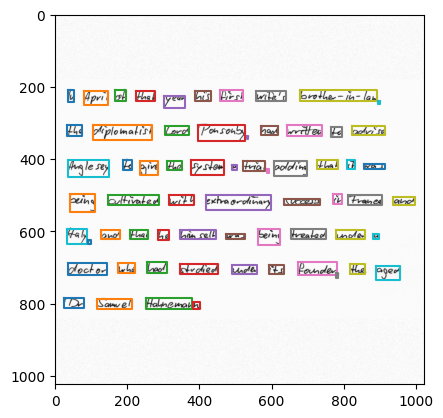

In [30]:
import random
from matplotlib import pyplot as plt
import numpy as np

dataset = random.choice([cvl_dataset, iam_dataset])
data, label = dataset[random.randint(0, len(dataset)-1)]
data = data.numpy().reshape(1024, 1024)
label = label.numpy()

# print(label.shape)

# for i in label:
#     for j in i:
#         print(int(j), end='\t')
#     print()

plt.imshow(data, cmap='gray')
for i in range(256):
    if label[i, 0] == 0:
        break
    x, y, w, h = label[i]
    x, y, w, h = int(x), int(y), int(w), int(h)
    plt.plot([x, x+w, x+w, x, x], [y, y, y+h, y+h, y])
plt.show()

In [7]:
from utils import *

cvl_dataset = RecDataset('CVL', 'train')
iam_dataset = RecDataset('IAM', 'train')

and


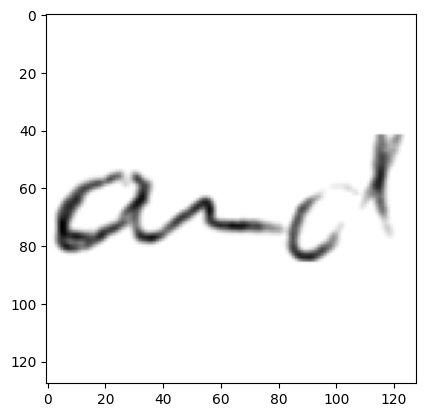

In [23]:
import random
from matplotlib import pyplot as plt
import numpy as np

dataset = random.choice([cvl_dataset, iam_dataset])
data, label = dataset[random.randint(0, len(dataset)-1)]
data = data.numpy().reshape(128, 128)
label = label.numpy()

# for i in label:
#     for j in i:
#         print(int(j), end=' ')
#     print()

for i in range(1, 64):
    o = np.argmax(label[i])
    if o == 3:
        break
    c = chr(o)
    print(c, end='')
print()
plt.imshow(data, cmap='gray')
plt.show()

检查IAM和CVL的数据的一致性

In [1]:
import torch
from PIL import Image
from utils import *
from torch.utils.data import DataLoader
import random

In [3]:
iam_dataset = SegDataset('IAM', 'train')
iam_loader = DataLoader(iam_dataset, batch_size=4, shuffle=True)
cvl_dataset = SegDataset('CVL', 'train')
cvl_loader = DataLoader(cvl_dataset, batch_size=4, shuffle=True)

CVL
torch.Size([4, 1, 1024, 1024]) torch.Size([4, 256, 4])


In [19]:
dataloader = random.choice([iam_loader, cvl_loader])


for data, label in dataloader:
    print(dataloader.dataset.name)
    print(data.shape, label.shape)
    print(data.mean(), data.std())
    print(data.min(), data.max())
    break

CVL
torch.Size([4, 1, 1024, 1024]) torch.Size([4, 256, 4])
tensor(250.5990) tensor(21.7147)
tensor(51.) tensor(255.)
